In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
import scanpy as sc
#import squidpy as sq
import anndata as ad
import seaborn as sns 
from joblib import parallel_backend
import scipy.stats as stats
import seaborn as sns; sns.set(color_codes=True)
import warnings
import harmonypy
import joblib 
import scanpy.external as sce
warnings.filterwarnings('ignore')
#%matplotlib inline
import pytometry as pm
import scprep
import os

# make anndata

In [ ]:
df4301 = pd.read_csv ('4301_indiv_out.csv')
ytma = pd.read_csv ('ytma_indiv_out.csv')
df4301.Image =df4301.Image.astype(str) 
ytma.Image =ytma.Image.astype(str) 
df4301['TMA'] = df4301['Image'].str[:4]
ytma['TMA'] = ytma['Image'].str[:8]
df4301['core'] = df4301['Image'].str[5:]
df4301['core'] = df4301['core'].str.replace('.tif','')
ytma['core'] = ytma['Image'].str[9:]
ytma['core'] = ytma['core'].str.replace('.tif','')

In [113]:
print(list(df4301.filter(like = ': Cell: Median', axis=1 )))

['DAPI: Cell: Median', 'CD45RO: Cell: Median', 'HLA-A: Cell: Median', 'CD4: Cell: Median', 'E-cadherin: Cell: Median', 'CD20: Cell: Median', 'CD68: Cell: Median', 'CD8: Cell: Median', 'cd14: Cell: Median', 'CD11c: Cell: Median', 'CD44: Cell: Median', 'Vimentin: Cell: Median', 'CD45: Cell: Median', 'Granzyme B: Cell: Median', 'CD34: Cell: Median', 'CD3e: Cell: Median', 'LAG3: Cell: Median', 'CD31: Cell: Median', 'PD-L1: Cell: Median', 'ICOS(CD278): Cell: Median', 'NAKATPASE: Cell: Median', 'FOXP3: Cell: Median', 'CD19: Cell: Median', 'CD163: Cell: Median', 'PAX5: Cell: Median', 'G6PD: Cell: Median', 'PD-1: Cell: Median', 'CD21: Cell: Median', 'SMA: Cell: Median', 'CD11B: Cell: Median', 'CD57: Cell: Median', 'HLA-DR: Cell: Median', 'pNRF2: Cell: Median', 'LDHA: Cell: Median', 'ATPA5: Cell: Median', 'Collagen IV: Cell: Median', 'GLUT1: Cell: Median', 'Hexokinase1: Cell: Median', 'ASCT2: Cell: Median', 'CITRATE SYNTHASE: Cell: Median', 'SDHA: Cell: Median', 'IDH2: Cell: Median', 'Ki67: Cel

In [137]:
df4301 = df4301[['TMA','core', 'Image', 'Object ID', 'Name', 'Class', 'Parent', 'ROI', 'Centroid X µm', 'Centroid Y µm', 
                 'Nucleus: Area µm^2', 'Nucleus: Length µm', 'Nucleus: Circularity', 'Nucleus: Solidity', 'Nucleus: Max diameter µm',
                 'Nucleus: Min diameter µm', 'Cell: Area µm^2', 'Cell: Length µm', 'Cell: Circularity', 'Cell: Solidity', 
                 'Cell: Max diameter µm', 'Cell: Min diameter µm', 'Nucleus/Cell area ratio','DAPI: Cell: Median','PAX5: Cell: Median',
                 'FOXP3: Cell: Median','CD45RO: Cell: Median',
'HLA-A: Cell: Median', 'CD4: Cell: Median', 'E-cadherin: Cell: Median', 'CD20: Cell: Median', 'CD68: Cell: Median', 
'CD8: Cell: Median', 'cd14: Cell: Median', 'CD11c: Cell: Median', 'CD44: Cell: Median', 'Vimentin: Cell: Median',
'CD45: Cell: Median', 'Granzyme B: Cell: Median', 'CD34: Cell: Median', 'CD3e: Cell: Median', 'LAG3: Cell: Median', 
'CD31: Cell: Median', 'PD-L1: Cell: Median', 'ICOS(CD278): Cell: Median', 'NAKATPASE: Cell: Median',
'CD19: Cell: Median', 'CD163: Cell: Median','G6PD: Cell: Median', 'PD-1: Cell: Median',
'CD21: Cell: Median', 'SMA: Cell: Median', 'CD11B: Cell: Median', 'CD57: Cell: Median', 'HLA-DR: Cell: Median',
'pNRF2: Cell: Median', 'LDHA: Cell: Median', 'ATPA5: Cell: Median', 'Collagen IV: Cell: Median', 'GLUT1: Cell: Median',
'Hexokinase1: Cell: Median', 'ASCT2: Cell: Median', 'CITRATE SYNTHASE: Cell: Median', 'SDHA: Cell: Median', 
'IDH2: Cell: Median', 'Ki67: Cell: Median', 'Pan-Cytokeratin: Cell: Median', 'CPT1A: Cell: Median']]

In [116]:
print(list(ytma.filter(like = ': Cell: Median', axis=1 )))


['DAPI: Cell: Median', 'CD45RO: Cell: Median', 'HLA-A: Cell: Median', 'CD4: Cell: Median', 'E-cadherin: Cell: Median', 'CD20: Cell: Median', 'CD68: Cell: Median', 'CD8: Cell: Median', 'CD14: Cell: Median', 'CD11c: Cell: Median', 'CD44: Cell: Median', 'Vimentin: Cell: Median', 'CD45: Cell: Median', 'Granzyme B: Cell: Median', 'CD34: Cell: Median', 'CD3e: Cell: Median', 'LAG3: Cell: Median', 'CD31: Cell: Median', 'PD-L1: Cell: Median', 'ICOS: Cell: Median', 'NakATPase: Cell: Median', 'FOXP3: Cell: Median', 'CD19: Cell: Median', 'CD163: Cell: Median', 'PAX5: Cell: Median', 'G6PD: Cell: Median', 'PD-1: Cell: Median', 'CD21: Cell: Median', 'SMA: Cell: Median', 'CD11b: Cell: Median', 'IDO1: Cell: Median', 'pNRFR2: Cell: Median', 'CD57: Cell: Median', 'Collagen IV: Cell: Median', 'ATPA5: Cell: Median', 'Citrate Synthase: Cell: Median', 'ASCT2: Cell: Median', 'SDHA: Cell: Median', 'HK1: Cell: Median', 'IDH2: Cell: Median', 'GLUT1: Cell: Median', 'LDHA: Cell: Median', 'Ki67: Cell: Median', 'Pan

In [139]:
ytma = ytma[['TMA','core', 'Image', 'Object ID', 'Name', 'Class', 'Parent', 'ROI', 'Centroid X µm', 'Centroid Y µm', 
                 'Nucleus: Area µm^2', 'Nucleus: Length µm', 'Nucleus: Circularity', 'Nucleus: Solidity', 'Nucleus: Max diameter µm',
                 'Nucleus: Min diameter µm', 'Cell: Area µm^2', 'Cell: Length µm', 'Cell: Circularity', 'Cell: Solidity', 
                 'Cell: Max diameter µm', 'Cell: Min diameter µm', 'Nucleus/Cell area ratio','DAPI: Cell: Median','PAX5: Cell: Median','FOXP3: Cell: Median','CD45RO: Cell: Median', 
  'HLA-A: Cell: Median', 'CD4: Cell: Median', 'E-cadherin: Cell: Median', 'CD20: Cell: Median', 'CD68: Cell: Median', 
  'CD8: Cell: Median', 'CD14: Cell: Median', 'CD11c: Cell: Median', 'CD44: Cell: Median', 'Vimentin: Cell: Median', 
  'CD45: Cell: Median', 'Granzyme B: Cell: Median', 'CD34: Cell: Median', 'CD3e: Cell: Median', 'LAG3: Cell: Median',
  'CD31: Cell: Median', 'PD-L1: Cell: Median', 'ICOS: Cell: Median', 'NakATPase: Cell: Median', 
  'CD19: Cell: Median', 'CD163: Cell: Median', 'G6PD: Cell: Median', 'PD-1: Cell: Median', 
  'CD21: Cell: Median', 'SMA: Cell: Median', 'CD11b: Cell: Median', 'IDO1: Cell: Median', 'pNRFR2: Cell: Median', 
  'CD57: Cell: Median', 'Collagen IV: Cell: Median', 'ATPA5: Cell: Median', 'Citrate Synthase: Cell: Median',
  'ASCT2: Cell: Median', 'SDHA: Cell: Median', 'HK1: Cell: Median', 'IDH2: Cell: Median', 'GLUT1: Cell: Median', 
  'LDHA: Cell: Median', 'Ki67: Cell: Median', 'Pan-Cytokeratin: Cell: Median', 'CPT1A: Cell: Median']]

In [141]:
df4301.columns= df4301.columns.str.removesuffix(': Cell: Median')
df4301.columns= df4301.columns.str.removesuffix(': Nucleus: Median')
ytma.columns= ytma.columns.str.removesuffix(': Cell: Median')
ytma.columns= ytma.columns.str.removesuffix(': Nucleus: Median')

In [143]:
df4301 = df4301.rename(columns= {'CITRATE SYNTHASE':"Citrate Synthase", 'NAKATPASE':"NakATPase",'Hexokinase1':"HK1", 
                        'ICOS(CD278)':"ICOS",'pNRF2':"pNRFR2",'CD11B':"CD11b",'cd14':"CD14"})

In [144]:
ytma.columns.difference(df4301.columns)

Index(['IDO1'], dtype='object')

In [145]:
df4301.columns.difference(ytma.columns)

Index(['HLA-DR'], dtype='object')

In [147]:
ytma = ytma.drop('IDO1', axis=1)
df4301 = df4301.drop('HLA-DR', axis=1)

In [148]:
data = pd.concat([df4301,ytma])

In [152]:
meta = data[['TMA', 'core', 'Image', 'Object ID', 'Name', 'Class', 'Parent', 'ROI',
       'Centroid X µm', 'Centroid Y µm', 'Nucleus: Area µm^2',
       'Nucleus: Length µm', 'Nucleus: Circularity', 'Nucleus: Solidity',
       'Nucleus: Max diameter µm', 'Nucleus: Min diameter µm',
       'Cell: Area µm^2', 'Cell: Length µm', 'Cell: Circularity',
       'Cell: Solidity', 'Cell: Max diameter µm', 'Cell: Min diameter µm',
       'Nucleus/Cell area ratio']]
data.X = data[['DAPI', 'PAX5', 'FOXP3', 'CD45RO', 'HLA-A',
       'CD4', 'E-cadherin', 'CD20', 'CD68', 'CD8', 'CD14', 'CD11c', 'CD44',
       'Vimentin', 'CD45', 'Granzyme B', 'CD34', 'CD3e', 'LAG3', 'CD31',
       'PD-L1', 'ICOS', 'NakATPase', 'CD19', 'CD163', 'G6PD', 'PD-1', 'CD21',
       'SMA', 'CD11b', 'CD57', 'pNRFR2', 'LDHA', 'ATPA5', 'Collagen IV',
       'GLUT1', 'HK1', 'ASCT2', 'Citrate Synthase', 'SDHA', 'IDH2', 'Ki67',
       'Pan-Cytokeratin', 'CPT1A','Nucleus: Area µm^2']]


In [ ]:
meta = meta.rename(columns= {'Centroid X µm':"x", 'Centroid Y µm':"y"})
data.X = data.X.rename(columns = {'Nucleus: Area µm^2': 'nsize'})
adata = ad.AnnData(data.X)
adata.obs = meta
spatial=pd.DataFrame(adata.obs[['x','y']])
spatial=spatial.to_numpy()
adata.obsm["spatial"]=spatial

In [159]:
adata.obs['Image'] = adata.obs['Image'].str.replace('.tif','')

In [160]:
adata.obs.shape

(433032, 23)

In [161]:
len(adata.var_names)

45

In [162]:
print(set(adata.obs.TMA))

{'4301', 'YTMA_404', 'YTMA_471'}


In [163]:
adata.X.shape

(433032, 45)

In [168]:
adata.write(filename='ytma_4301.h5ad')

In [169]:
adata.var_names

Index(['DAPI', 'PAX5', 'FOXP3', 'CD45RO', 'HLA-A', 'CD4', 'E-cadherin', 'CD20',
       'CD68', 'CD8', 'CD14', 'CD11c', 'CD44', 'Vimentin', 'CD45',
       'Granzyme B', 'CD34', 'CD3e', 'LAG3', 'CD31', 'PD-L1', 'ICOS',
       'NakATPase', 'CD19', 'CD163', 'G6PD', 'PD-1', 'CD21', 'SMA', 'CD11b',
       'CD57', 'pNRFR2', 'LDHA', 'ATPA5', 'Collagen IV', 'GLUT1', 'HK1',
       'ASCT2', 'Citrate Synthase', 'SDHA', 'IDH2', 'Ki67', 'Pan-Cytokeratin',
       'CPT1A', 'nsize'],
      dtype='object')

In [171]:
adata.X

array([[ 58.    ,   2.    ,   2.    , ...,  27.    ,   4.    ,  55.6525],
       [  7.    ,   1.    ,   1.    , ...,   2.    ,   1.    ,  46.8817],
       [ 20.    ,  21.    ,  11.    , ...,  12.    ,   5.    ,  28.0115],
       ...,
       [ 17.    ,   1.    ,   1.    , ...,  32.    ,   0.    ,  60.8326],
       [ 24.    ,   2.    ,   0.    , ...,  18.    ,   0.    ,  52.5096],
       [ 21.    ,   1.    ,   1.    , ...,  39.    ,   0.    , 134.3275]])

# curate samples

In [7]:
adata.obs['core'] = adata.obs['core'].str.replace('-','').adata.obs.Image =adata.obs.Image.astype(str)
adata.obs.Parent =adata.obs.Parent.astype(str)

In [9]:
adata = adata[adata.obs['TMA'].isin(['4301']) & adata.obs['Parent'].isin(['D2','H4','F1'])== False].copy()

In [10]:
adata = adata[adata.obs['TMA'].isin(['YTMA_404']) & adata.obs['Parent'].isin(['I5','H8','H9','D6','A7','C8', 'G7'])== False].copy()

In [11]:
adata = adata[adata.obs['TMA'].isin(['YTMA_471']) & adata.obs['Parent'].isin(['H3','G6','A6','A8','A9','A10','B2','B6','B9','B10',
'C5','C4','F10','I6','I8','I9','J1','J3','J6','J8','K6','K7','L6','L3','G3','G8', 'H7'])== False].copy()

In [12]:
print(set(adata.obs['core'][adata.obs['TMA']=='4301']))

{'F2', 'D2', 'B1', 'A5', 'C2', 'B4', 'H4', 'I1', 'D5', 'E1', 'B2', 'G3', 'A2', 'E2', 'C5', 'G1', 'H2', 'H3', 'B5', 'B3', 'C1', 'A1', 'A4', 'E5', 'C4', 'G4', 'E3', 'G2', 'D4', 'A3', 'D3', 'I2', 'C3', 'F1', 'D1', 'F3', 'G5', 'F4', 'H1', 'E4', 'F5'}


In [13]:
len(set(adata.obs['core'][adata.obs['TMA']=='4301']))

41

In [14]:
print(set(adata.obs['core'][adata.obs['TMA']=='YTMA_404']))

{'F2', 'F7', 'H9', 'D6', 'A7', 'E10', 'G6', 'A5', 'C2', 'B4', 'F6', 'H4', 'H8', 'I5', 'C10', 'E7', 'C8', 'C9', 'A6', 'A10', 'B10', 'H10', 'C1', 'A4', 'G7', 'E3', 'D4', 'D3', 'F10', 'F1', 'E9', 'H7', 'H1', 'G9', 'B9', 'D8', 'D9', 'F5'}


In [15]:
len(set(adata.obs['core'][adata.obs['TMA']=='YTMA_404']))

38

In [16]:
print(set(adata.obs['core'][adata.obs['TMA']=='YTMA_471']))

{'A9', 'F7', 'B1', 'I5', 'A5', 'H4', 'D5', 'E2', 'C5', 'G1', 'K9', 'B3', 'I7', 'B10', 'H6', 'C1', 'A1', 'A4', 'J2', 'J4', 'C4', 'G7', 'G2', 'C6', 'F9', 'F1', 'H7', 'B8', 'L1', 'L5', 'D6', 'G6', 'E10', 'H8', 'F6', 'K10', 'I1', 'E1', 'L6', 'C8', 'G3', 'K8', 'H3', 'L4', 'A8', 'K1', 'H10', 'G10', 'J6', 'E5', 'D4', 'E8', 'J8', 'D3', 'F10', 'J7', 'K7', 'K5', 'I6', 'H1', 'E4', 'D8', 'I9', 'F2', 'G8', 'H9', 'I4', 'I8', 'I3', 'J9', 'B2', 'B5', 'A10', 'I10', 'C7', 'J10', 'E3', 'C3', 'D7', 'D10', 'D9', 'D2', 'K2', 'L3', 'J5', 'K6', 'L2', 'A7', 'C2', 'B4', 'J3', 'J1', 'E7', 'C9', 'K4', 'A2', 'A6', 'H2', 'E6', 'A3', 'F8', 'E9', 'D1', 'F3', 'F4', 'B9', 'F5'}


In [17]:
len(set(adata.obs['core'][adata.obs['TMA']=='YTMA_471']))

107

In [21]:
adata_full = adata
adata_full.write(filename='adata_full.h5ad')

# Cell Phenoyping cell lineages

In [24]:
ct = ['CD45','CD3e','CD4','CD8', 'CD20', 'CD14','CD68','CD11b', 'CD11c', 'CD31', 'CD34',  'SMA','Vimentin','E-cadherin','Pan-Cytokeratin', 'nsize']
adata = adata[:,adata.var_names.isin(ct)].copy()
adata.var_names

Index(['CD4', 'E-cadherin', 'CD20', 'CD68', 'CD8', 'CD14', 'CD11c', 'Vimentin',
       'CD45', 'CD34', 'CD3e', 'CD31', 'SMA', 'CD11b', 'Pan-Cytokeratin',
       'nsize'],
      dtype='object')

In [25]:
adata1 = adata[adata.obs.TMA.isin(['YTMA_404'])].copy()
adata2 = adata[adata.obs.TMA.isin(['YTMA_471'])].copy()
adata3 = adata[adata.obs.TMA.isin(['4301'])].copy()

pm.tl.normalize_arcsinh(adata1, cofactor=150, inplace=True)
pm.tl.normalize_arcsinh(adata2, cofactor=150, inplace=True)
pm.tl.normalize_arcsinh(adata3, cofactor=150, inplace=True)


sc.pp.scale(adata1)
sc.pp.scale(adata2)
sc.pp.scale(adata3)

adata1.X = stats.zscore(adata1.X,axis=1)
adata2.X = stats.zscore(adata2.X,axis=1)
adata3.X = stats.zscore(adata3.X,axis=1)

adata= adata1.concatenate(adata2,adata3)

In [41]:
sc.tl.pca(adata)

with parallel_backend('threading', n_jobs=64):
    sc.external.pp.harmony_integrate (adata, key='TMA',max_iter_harmony = 40)
    
adata.obsm['X_pca_d']=adata.obsm['X_pca']
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony'] 

2023-08-21 11:27:50,629 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-08-21 11:28:41,119 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-08-21 11:28:43,051 - harmonypy - INFO - Iteration 1 of 40
2023-08-21 11:31:51,213 - harmonypy - INFO - Iteration 2 of 40
2023-08-21 11:35:00,234 - harmonypy - INFO - Iteration 3 of 40
2023-08-21 11:38:04,075 - harmonypy - INFO - Iteration 4 of 40
2023-08-21 11:41:08,613 - harmonypy - INFO - Iteration 5 of 40
2023-08-21 11:44:14,707 - harmonypy - INFO - Iteration 6 of 40
2023-08-21 11:46:26,872 - harmonypy - INFO - Iteration 7 of 40
2023-08-21 11:47:45,052 - harmonypy - INFO - Iteration 8 of 40
2023-08-21 11:48:46,451 - harmonypy - INFO - Iteration 9 of 40
2023-08-21 11:49:38,607 - harmonypy - INFO - Iteration 10 of 40
2023-08-21 11:50:30,917 - harmonypy - INFO - Iteration 11 of 40
2023-08-21 11:51:22,658 - harmonypy - INFO - Iteration 12 of 40
2023-08-21 11:52:14,489 - harmonypy - INFO - Iteration 13 of

In [42]:
adata.write(filename='ytma4301ct_prepheno.h5ad')


## Optimise K #

In [7]:
# define a function that will give us the relevant output for the input k
def calc_cluster_characteristics(k, PCA):
    results = pd.Series(dtype = 'float64')
    results['k'] = k
    results['communities'], results['graph'], results['Q'] = phenograph.cluster(PCA, k=k)
    results['components'], _ = sparse.csgraph.connected_components(results['graph'], directed = False)
    return results

ks = np.arange(10, 101, 5)  # This is the range of k values we will look at
with parallel_backend('threading', n_jobs=64):
    cluster_chars_list = [calc_cluster_characteristics(k, adata.obsm['X_pca']) for k in ks]
cluster_characteristics = pd.concat(cluster_chars_list, axis = 1).transpose()

Finding 10 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 125.06337380409241 seconds
Jaccard graph constructed in 12.418102741241455 seconds
Wrote graph to binary file in 2.489072799682617 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.925171
Louvain completed 21 runs in 297.7844502925873 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 440.6810894012451 seconds
Finding 15 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 106.48153162002563 seconds
Jaccard graph constructed in 16.502522706985474 seconds
Wrote graph to binary file in 4.100826025009155 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.907089
After 5 runs, maximum modularity is Q = 0.908586
Louvain completed 25 runs in 443.99378871917725 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 574.3077394962311 seconds
Find

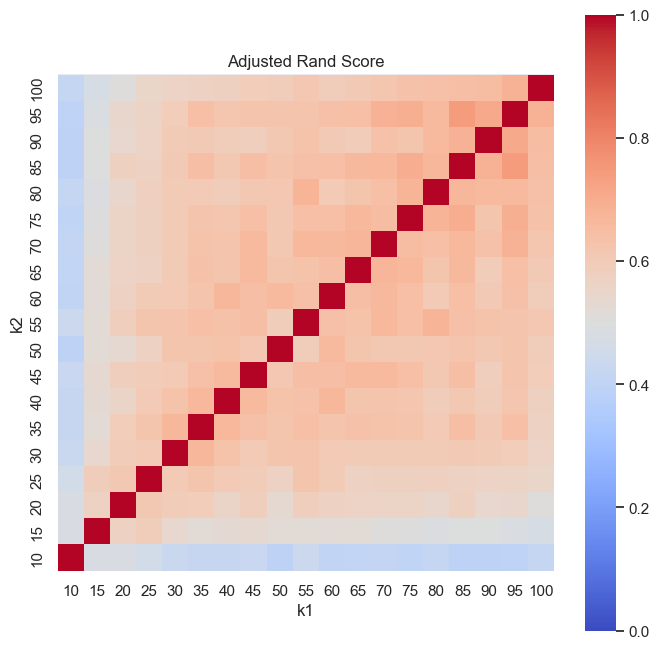

In [8]:
n = len(ks)
Rand_indices = pd.DataFrame(np.zeros((n,n)), index = ks, columns = ks)

Rand_indices.index.name = 'k1'
Rand_indices.columns.name = 'k2'

for i in range(n):
    for j in range(n):
        Rand_indices.iloc[i, j] = adjusted_rand_score(
            cluster_characteristics['communities'][i], 
            cluster_characteristics['communities'][j]
        )
        
plt.figure(figsize = (8,8))
sns.heatmap(Rand_indices, cmap=('coolwarm'), square=True, vmin=0, vmax=1).invert_yaxis()
sns.set(font_scale=1)
plt.xlabel('k1')
plt.ylabel('k2')
plt.title('Adjusted Rand Score')
plt.savefig('CT_rand.svg')

## run Phenograph # 

In [25]:
sce.tl.phenograph(adata, clustering_algo= 'leiden', resolution_parameter=0.2, n_jobs= -1, k= 15)

del adata.obsp['pheno_jaccard_ig']
adata.write(filename='ytma4301ct_pheno.h5ad')


Finding 15 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 135.07984256744385 seconds
Jaccard graph constructed in 15.52659559249878 seconds
Running Leiden optimization
Leiden completed in 490.95766139030457 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 649.9604189395905 seconds


In [27]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=10, use_rep = 'X_pca_d')
sc.tl.umap(adata)

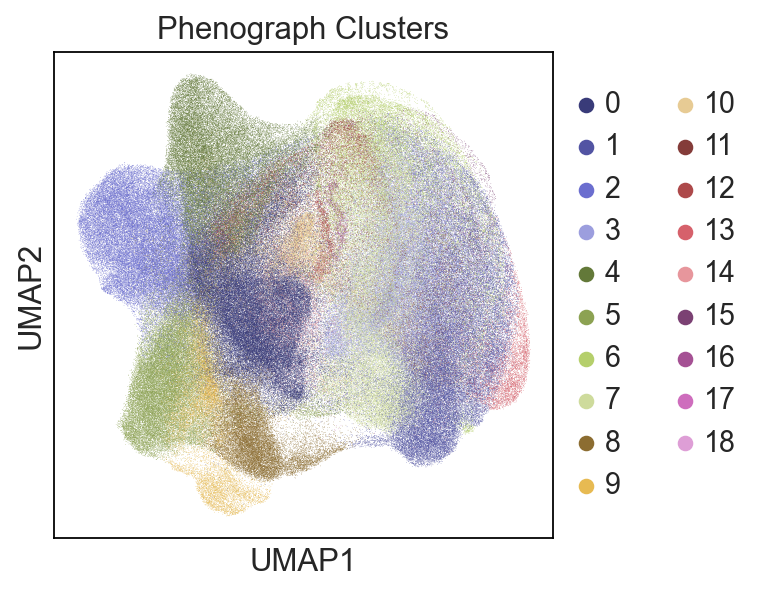

In [29]:
sc.pl.umap(
    adata, 
    color=['pheno_leiden'],
    palette='tab20b', # 'palette' specifies the colormap to use)
    title=["Phenograph Clusters"],save = 'CT.svg')

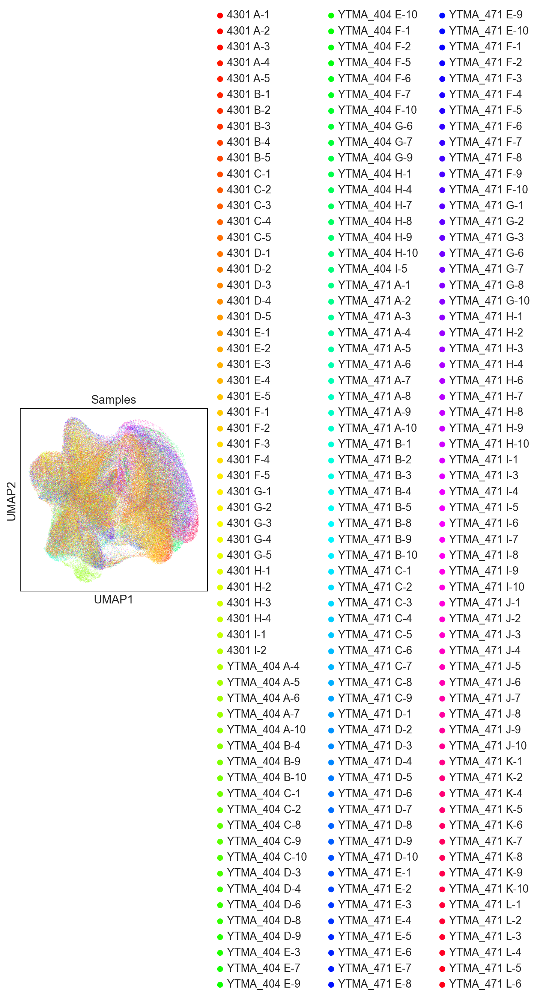

In [30]:
sc.pl.umap(
    adata, 
    color=['Image'],
    palette='hsv', # 'palette' specifies the colormap to use)
    title=["Samples"],save = 'CT_samples.svg')

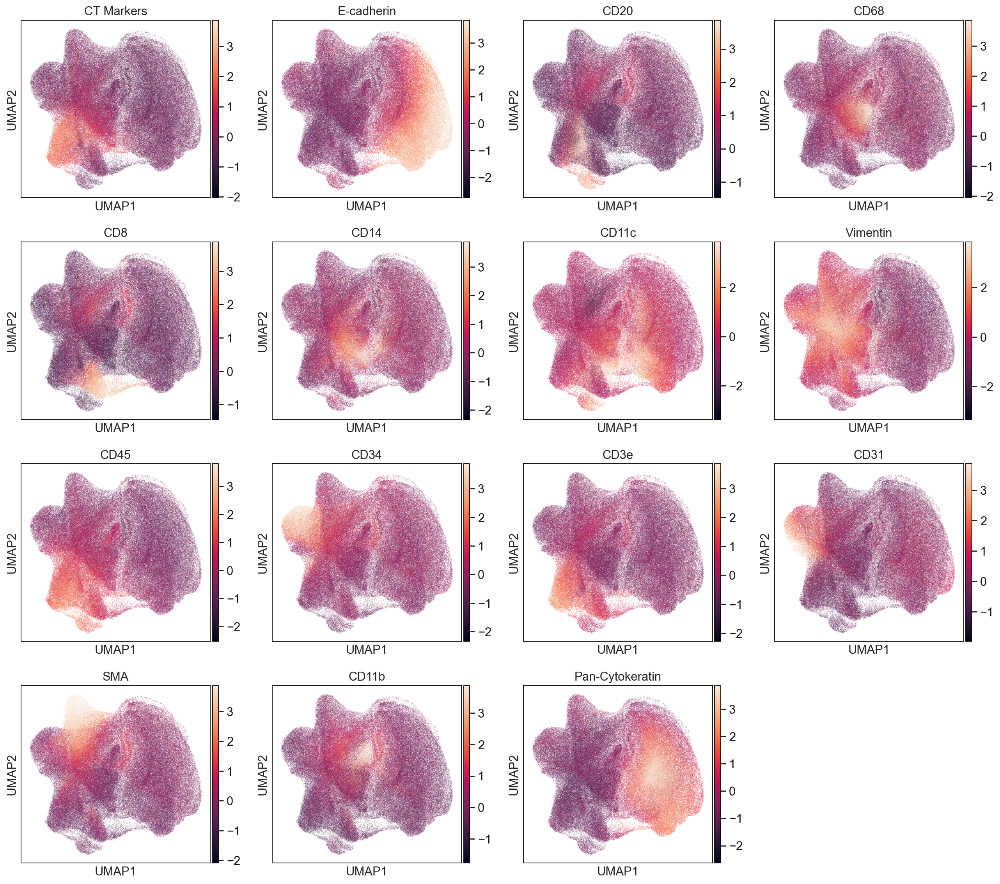

In [31]:
sc.pl.umap(
    adata, 
    color=['CD4', 'E-cadherin', 'CD20', 'CD68', 'CD8', 'CD14', 'CD11c', 'Vimentin',
       'CD45', 'CD34', 'CD3e', 'CD31', 'SMA', 'CD11b', 'Pan-Cytokeratin'],
    palette='inferno', # 'palette' specifies the colormap to use)
    title=["CT Markers"],save = 'CT_markers.svg')

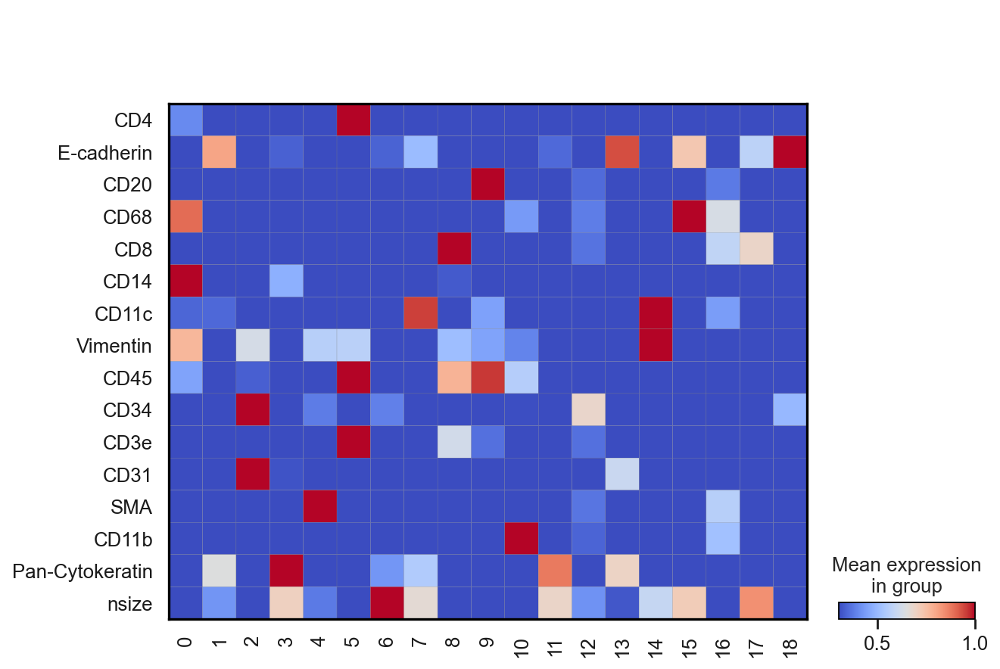

In [33]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=400)

sc.pl.matrixplot(adata, var_names= adata.var_names, groupby='pheno_leiden', dendrogram=False,
                 use_raw=False, cmap="coolwarm", standard_scale='var', vmin = 0.3,
                 swap_axes= True,
                 save = 'ytma4301_ct.svg')

In [34]:
pd.set_option('display.max_rows', 69)
adata.obs.pheno_leiden.value_counts()

pheno_leiden
0     71033
1     52318
2     47746
3     39603
4     39404
5     36004
6     33402
7     30532
8     21054
9     15853
10    13432
11     8906
12     8161
13     5665
14     4489
15     2909
16     1621
17      588
18      312
Name: count, dtype: int64

In [35]:
pd.set_option('display.max_rows', 169)
pd.set_option('display.max_columns', 114)
pd.crosstab([adata.obs.Image, adata.obs.TMA], adata.obs.pheno_leiden, normalize = False)

,pheno_leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
Image,TMA,,,,,,,,,,,,,,,,,,,
4301 A-1,4301,1026,76,364,175,462,280,1496,80,259,49,1,374,301,0,0,0,1,2,0
4301 A-2,4301,980,1,98,1049,947,26,34,9,21,0,47,94,15,0,0,0,6,1,0
4301 A-3,4301,1792,39,235,328,530,191,97,19,206,0,2,120,277,0,14,1,2,2,0
4301 A-4,4301,452,2,1043,67,267,18,75,109,58,1,15,33,441,0,6,0,12,0,0
4301 A-5,4301,68,218,158,108,201,17,170,7,49,0,0,3137,173,1,0,0,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YTMA_471 L-2,YTMA_471,199,269,423,78,532,64,269,7,22,8,19,0,28,2,2,0,0,0,0
YTMA_471 L-3,YTMA_471,12,6,98,7,24,10,91,31,8,2,2,0,24,0,0,0,0,0,0
YTMA_471 L-4,YTMA_471,323,0,171,23,31,135,48,62,44,4,7,0,138,0,0,0,1,0,0


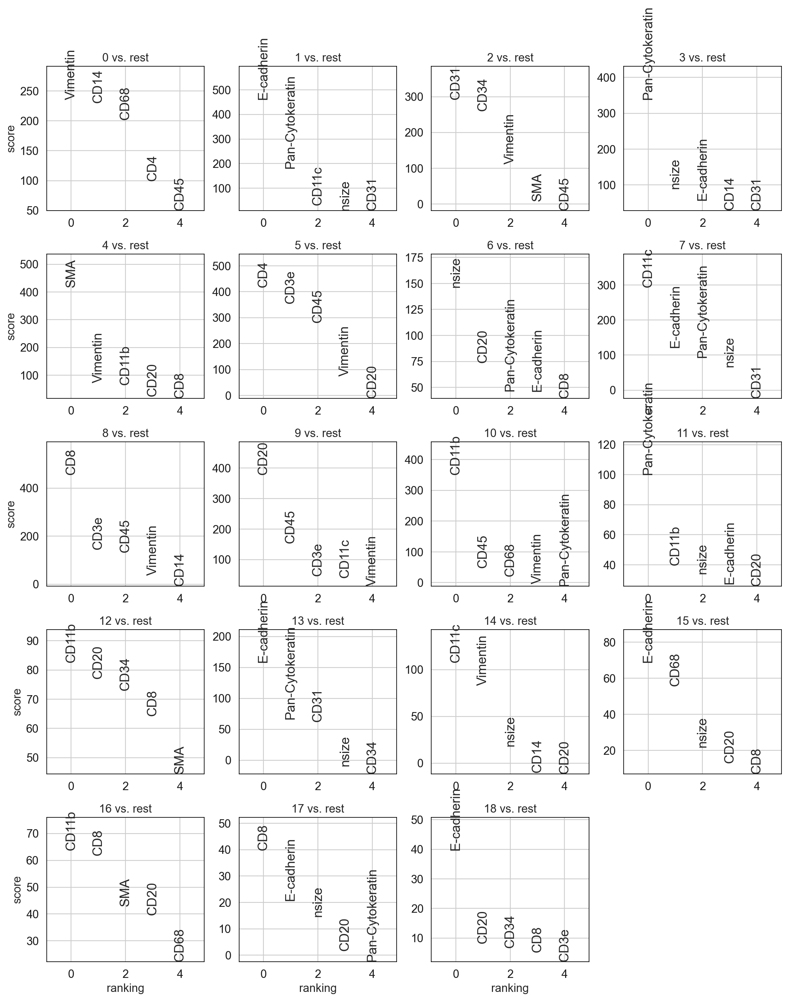

In [36]:
sc.tl.rank_genes_groups(adata, 'pheno_leiden', method='t-test_overestim_var')
sc.pl.rank_genes_groups(adata, n_genes=5,sharey=False, fontsize=16, save= 'CT.svg')

In [117]:
adata.write(filename='ytma4301ct_pheno.h5ad')
adata = sc.read('ytma4301ct_pheno.h5ad')
adata_full = sc.read(filename='adata_full.h5ad')

### label clusters and merge

In [118]:
CT_1 = {
0: 'Macrophage',
1: 'Tumour',
2: 'Vessels',
3: 'Tumour',
4: 'Stroma',
5: 'CD4_cells',
6: 'Tumour',
7: 'Tumour',
8: 'CD8_cells',
9: 'B_Cells',
10: 'Granulocytes',
11: 'Tumour',
12: 'Stroma',
13: 'Tumour',
14: 'DCs',
15: 'Tumour',
16: 'Unidentified',
17: 'Tumour',
18: 'Tumour'
}

adata.obs['CT_1'] = (
    adata.obs['pheno_leiden']
    .map(CT_1
        )
    .astype('category')
)

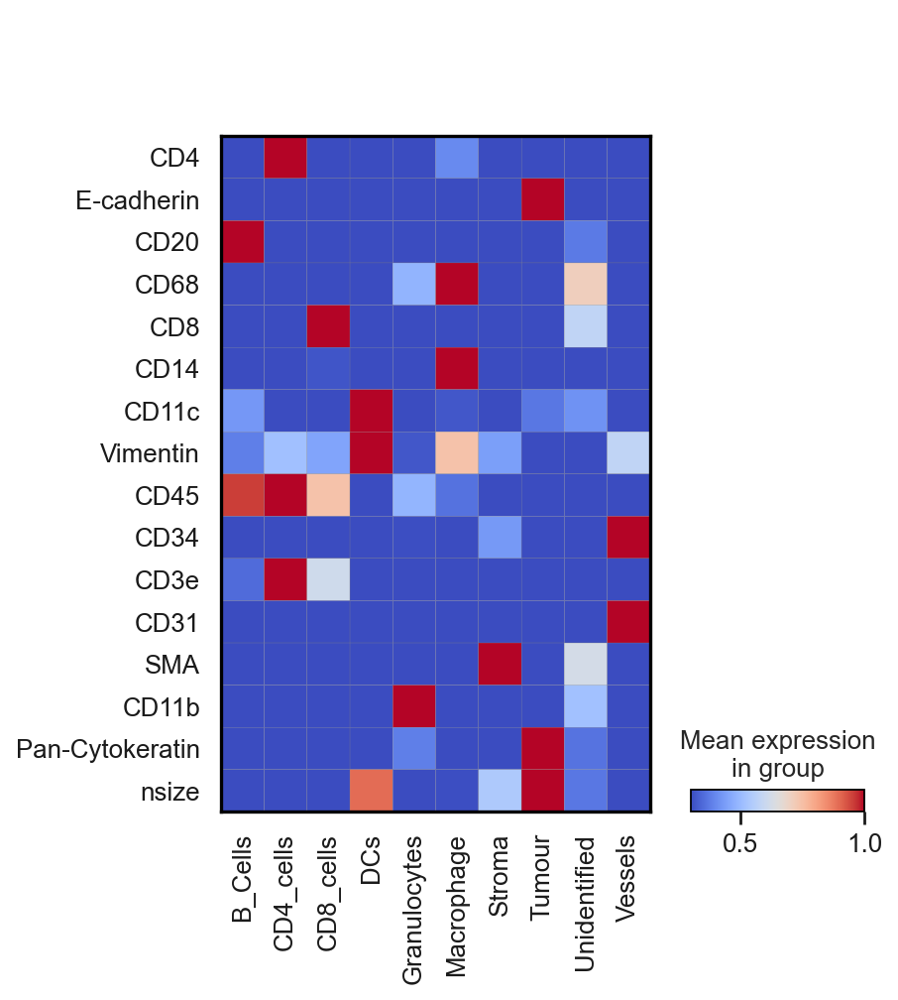

In [119]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=400)

sc.pl.matrixplot(adata, var_names= adata.var_names, groupby='CT_1', dendrogram=False,
                 use_raw=False, cmap="coolwarm", standard_scale='var', vmin = 0.3,
                 swap_axes= True,
                 save = 'ytma4301_ctannotated.svg')

In [120]:
adata_full.obs = pd.merge(adata_full.obs, adata.obs[['Object ID', 'CT_1']], on= 'Object ID', how = 'left')
adata_full.write(filename='ytma4301_full_CT_1.h5ad')
adata.write(filename='ytma4301_CT_1.h5ad')
adata = sc.read('ytma4301_full_CT_1.h5ad')

In [426]:
adata

AnnData object with n_obs × n_vars = 433032 × 45
    obs: 'TMA', 'core', 'Image', 'Object ID', 'Name', 'Class', 'Parent', 'ROI', 'x', 'y', 'Nucleus: Area µm^2', 'Nucleus: Length µm', 'Nucleus: Circularity', 'Nucleus: Solidity', 'Nucleus: Max diameter µm', 'Nucleus: Min diameter µm', 'Cell: Area µm^2', 'Cell: Length µm', 'Cell: Circularity', 'Cell: Solidity', 'Cell: Max diameter µm', 'Cell: Min diameter µm', 'Nucleus/Cell area ratio', 'CT_1'
    obsm: 'spatial'

In [427]:
pd.set_option('display.max_rows', 15)
adata.obs.CT_1.value_counts(normalize= False)

CT_1
Tumour          174235
Macrophage       71033
Vessels          47746
Stroma           47565
CD4_cells        36004
CD8_cells        21054
B_Cells          15853
Granulocytes     13432
DCs               4489
Unidentified      1621
Name: count, dtype: int64

# CT CD4

In [428]:
CD4 = ['CD45', 'CD4','CD45RO','CD3e','ICOS','Ki67' ]
adata = adata[:,adata.var_names.isin(CD4)].copy()
adata = adata[adata.obs['CT_1'].isin(['CD4_cells'])]

In [430]:
adata1 = adata[adata.obs.TMA.isin(['YTMA_404'])].copy()
adata2 = adata[adata.obs.TMA.isin(['YTMA_471'])].copy()
adata3 = adata[adata.obs.TMA.isin(['4301'])].copy()

In [431]:
pm.tl.normalize_arcsinh(adata1, cofactor=150, inplace=True)
pm.tl.normalize_arcsinh(adata2, cofactor=150, inplace=True)
pm.tl.normalize_arcsinh(adata3, cofactor=150, inplace=True)

sc.pp.scale(adata1)
sc.pp.scale(adata2)
sc.pp.scale(adata3)

adata1.X = stats.zscore(adata1.X,axis=1)
adata2.X = stats.zscore(adata2.X,axis=1)
adata3.X = stats.zscore(adata3.X,axis=1)

adata= adata1.concatenate(adata2,adata3)

In [435]:
sc.tl.pca(adata)

with parallel_backend('threading', n_jobs=64):
    sc.external.pp.harmony_integrate (adata, key='TMA',max_iter_harmony = 40)
    
adata.obsm['X_pca_d']=adata.obsm['X_pca']
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony'] 

2023-08-23 11:09:56,675 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-08-23 11:10:03,608 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-08-23 11:10:03,821 - harmonypy - INFO - Iteration 1 of 40
2023-08-23 11:10:21,699 - harmonypy - INFO - Iteration 2 of 40
2023-08-23 11:10:39,918 - harmonypy - INFO - Iteration 3 of 40
2023-08-23 11:10:57,572 - harmonypy - INFO - Iteration 4 of 40
2023-08-23 11:11:15,051 - harmonypy - INFO - Iteration 5 of 40
2023-08-23 11:11:32,844 - harmonypy - INFO - Iteration 6 of 40
2023-08-23 11:11:50,684 - harmonypy - INFO - Iteration 7 of 40
2023-08-23 11:12:09,191 - harmonypy - INFO - Iteration 8 of 40
2023-08-23 11:12:28,006 - harmonypy - INFO - Iteration 9 of 40
2023-08-23 11:12:45,764 - harmonypy - INFO - Iteration 10 of 40
2023-08-23 11:13:04,590 - harmonypy - INFO - Iteration 11 of 40
2023-08-23 11:13:22,584 - harmonypy - INFO - Iteration 12 of 40
2023-08-23 11:13:40,470 - harmonypy - INFO - Iteration 13 of

In [436]:
sce.tl.phenograph(adata, clustering_algo= 'leiden', resolution_parameter=0.08, n_jobs= -1, k= 60)

Finding 60 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1.1141493320465088 seconds
Jaccard graph constructed in 7.680962324142456 seconds
Running Leiden optimization
Leiden completed in 4.2708210945129395 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 17.155848503112793 seconds


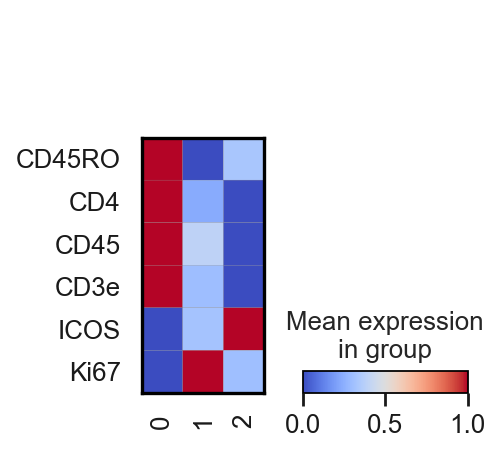

In [437]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=400)

sc.pl.matrixplot(adata, var_names= adata.var.index, groupby='pheno_leiden', dendrogram=False,
                 use_raw=False, cmap="coolwarm", standard_scale='var', 
                 swap_axes= True,
                 save = 'CD4_sub.svg')

In [438]:
del adata.obsp['pheno_jaccard_ig']
adata.write(filename='CD4_sub.h5ad')

In [439]:
adata.obs[(adata.obs.TMA.isin(['4301']))].to_csv('qupathout/4301_subCD4.csv')
adata.obs[(adata.obs.TMA.isin(['YTMA_404']))].to_csv('qupathout/404_subCD4.csv')
adata.obs[(adata.obs.TMA.isin(['YTMA_471']))].to_csv('qupathout/471_subCD4.csv')

In [440]:
adata.obs.pheno_leiden.value_counts()

pheno_leiden
0    18204
1    13266
2     4534
Name: count, dtype: int64

In [441]:
CD4_types = {
0: 'CD4',
1: 'CD4',
2: 'CD4_TFH',    
}

adata.obs['CD4_types'] = (
    adata.obs['pheno_leiden']
    .map(CD4_types)
    .astype('category')
)

In [442]:
foxp3 = pd.read_csv('qupathin/foxp3cells.csv')
foxp3 = foxp3[foxp3.Class.isin(['FOXP3'])].copy()
foxp3 = foxp3.rename(columns= {'Class':"foxp3cell"})
adata.obs = pd.merge(adata.obs, foxp3[['Object ID', 'foxp3cell']], on= 'Object ID', how = 'left')
adata_full.obs = pd.merge(adata_full.obs, adata.obs[['Object ID', 'CD4_types', 'foxp3cell']], on= 'Object ID', how = 'left')

In [445]:
adata_full.write(filename='adata_full_ct_cd4.h5ad')
adata.write(filename='CD4_sub.h5ad')
adata = sc.read('adata_full_ct_cd4.h5ad')

# CT CD8

In [451]:
adata = adata[adata.obs['CT_1'].isin(['CD8_cells'])]

In [452]:
cd8 = pd.read_csv('qupathin/pd1cells.csv')
cd8 = cd8[cd8.Class.isin(['PD-1'])].copy()
cd8 = cd8.rename(columns= {'Class':"pd1cell"})

In [453]:
gzmb = pd.read_csv('qupathin/gzmbcells.csv')
gzmb = gzmb[gzmb.Class.isin(['Granzyme B'])].copy()
gzmb = gzmb.rename(columns= {'Class':"gzmbcell"})

In [454]:
adata.obs = pd.merge(adata.obs, cd8[['Object ID', 'pd1cell']], on= 'Object ID', how = 'left')
adata.obs = pd.merge(adata.obs, gzmb[['Object ID', 'gzmbcell']], on= 'Object ID', how = 'left')
adata.obs['gzmbcell'] =adata.obs['gzmbcell'].astype(str)

In [456]:
adata_full.obs = pd.merge(adata_full.obs, adata.obs[['Object ID', 'pd1cell','gzmbcell']], on= 'Object ID', how = 'left')
adata.write(filename='CD8_sub.h5ad')
adata_full.write(filename='adata_full_ct_cd4_cd8.h5ad')
adata = sc.read('adata_full_ct_cd4_cd8.h5ad')

# Macrophage types

In [463]:
adata = adata[adata.obs['CT_1'].isin(['Macrophage'])]

In [464]:
adata1 = adata[adata.obs.TMA.isin(['YTMA_404'])].copy()
adata2 = adata[adata.obs.TMA.isin(['YTMA_471'])].copy()
adata3 = adata[adata.obs.TMA.isin(['4301'])].copy()

pm.tl.normalize_arcsinh(adata1, cofactor=150, inplace=True)
pm.tl.normalize_arcsinh(adata2, cofactor=150, inplace=True)
pm.tl.normalize_arcsinh(adata3, cofactor=150, inplace=True)


sc.pp.scale(adata1)
sc.pp.scale(adata2)
sc.pp.scale(adata3)

adata1.X = stats.zscore(adata1.X,axis=1)
adata2.X = stats.zscore(adata2.X,axis=1)
adata3.X = stats.zscore(adata3.X,axis=1)

adata= adata1.concatenate(adata2,adata3)

In [465]:
#from https://pathml.readthedocs.io/en/latest/examples/link_codex.html
def phenotype(adata, annot_dict):
    """
    Given a dict of dicts including phenotypes and marker gene thresholds, phenotype cells.

    Args:
        adata : the anndata object.
        annot_dict (dict): annotation dictionary each key is a cell type of interest and
            its value is a dictionary indicating protein expression ranges for that cell type.
            Each value should be a tuple (min, max) containing the minimum and maximum thresholds.
    """

    # Get the count matrix
    data = adata.copy()
    countMat = data.to_df()

    # Annotate the cell types
    for label in annot_dict.keys() :
        for key, value in annot_dict[label].items():
            cond = np.logical_and.reduce([((countMat[k] >= countMat[k].quantile(list(v)[0])) & (countMat[k] <= countMat[k].quantile(list(v)[1]))) for k, v in annot_dict[label].items()])
            data.obs.loc[cond, 'mac_types'] = label
            # replace nan with unknown
            data.obs.mac_types.fillna('Macrophage', inplace = True)

    return data

In [466]:
annot_dict = {
    'M1_mac': {'CD68': (0.0, 1.0), 'CD14':(0.0, 1.0),'CD163':(0.0, 0.3)},
    'M2_mac': {'CD68': (0.0, 1.0), 'CD14':(0.0, 1.0),'CD163':(0.3, 1.0)}
    }
#'CD68': (0.0, 1.0), 'CD14':(0.0, 1.0), 

In [467]:
# Annotate the adata
adata_annot = phenotype(adata, annot_dict = annot_dict)
adata_annot.obs.mac_types.value_counts()

mac_types
M2_mac    49723
M1_mac    21310
Name: count, dtype: int64

In [468]:
adata_annot.obs[(adata_annot.obs.Image.isin(['YTMA_471']))].to_csv('471_macthresh.csv')
adata_full.obs = pd.merge(adata_full.obs, adata_annot.obs[['Object ID', 'mac_types']], on= 'Object ID', how = 'left')

In [470]:
adata.write(filename='adata_ct_cd4_cd8_mac.h5ad')
adata_full.write(filename='adata_full_ct_cd4_cd8_mac.h5ad')
adata = sc.read('adata_full_ct_cd4_cd8_mac.h5ad')

# Tumour Types

In [ ]:
adata = adata[adata.obs['CT_1'].isin(['Tumour'])]

In [479]:
ki67 = pd.read_csv('qupathin/ki67cells.csv')
ki67 = ki67[ki67.Class.isin(['Ki67'])].copy()
ki67 = ki67.rename(columns= {'Class':"ki67cell"})
adata.obs = pd.merge(adata.obs, ki67[['Object ID', 'ki67cell']], on= 'Object ID', how = 'left')

In [483]:
adata.obs['ki67cell'] =adata.obs['ki67cell'].astype(str)
adata_full.obs = pd.merge(adata_full.obs, adata.obs[['Object ID', 'ki67cell']], on= 'Object ID', how = 'left')
adata_full.obs = pd.merge(adata_full.obs, adata.obs[['Object ID', 'tumour_types']], on= 'Object ID', how = 'left')
adata.write(filename='tumour_sub.h5ad')

In [487]:
adata_full.write('adata_full_ct_cd4_cd8_mac_tumour.h5ad')
adata = sc.read('adata_full_ct_cd4_cd8_mac_tumour.h5ad')

# Merge cell types into single column

In [490]:
set(adata.obs.gzmbcell)

{'Granzyme B', 'nan', nan}

In [491]:
adata.obs.gzmbcell = adata.obs.gzmbcell.replace('nan', np.nan)

In [492]:
set(adata.obs.pd1cell)

{'PD-1', nan}

In [493]:
set(adata.obs.CD4_types)

{'CD4', 'CD4_TFH', nan}

In [494]:
set(adata.obs.foxp3cell)

{'FOXP3', nan}

In [495]:
set(adata.obs.mac_types)

{'M1_mac', 'M2_mac', nan}

In [496]:
set(adata.obs.ki67cell)

{'Ki67', 'nan', nan}

In [497]:
adata.obs.ki67cell = adata.obs.ki67cell.replace('nan', np.nan)

In [500]:
adata.obs['CT_final'] = adata.obs[['CT_1', 'CD4_types', 'foxp3cell', 'pd1cell', 'gzmbcell',
                                   'mac_types','ki67cell']].fillna(method='ffill', axis=1).iloc[:, -1]

In [502]:
adata.obs.replace({'CT_final': {'FOXP3':'Treg', 'PD-1':'Exhausted CD8', 'Granzyme B': 'Cytotoxic CD8', 'Macrophage': 'M1_mac','ki67cell':'Proliferating_Tumour'}}, inplace=True)

In [75]:
adata = sc.read('adataannotated.h5ad')

In [76]:
adata.obs.Image = adata.obs.Image.str.replace('-','')
meta = pd.read_csv('4301_ytma_meta.csv')
adata.obs = pd.merge(adata.obs, meta, on= ['Image'], how = 'left')

In [506]:
adata.write ('4301_ytma_nsclc_CTfinal.h5ad')

In [ ]:
adata1 = adata[adata.obs.TMA.isin(['YTMA_404'])].copy()
adata2 = adata[adata.obs.TMA.isin(['YTMA_471'])].copy()
adata3 = adata[adata.obs.TMA.isin(['4301'])].copy()

pm.tl.normalize_arcsinh(adata1, cofactor=150, inplace=True)
pm.tl.normalize_arcsinh(adata2, cofactor=150, inplace=True)
pm.tl.normalize_arcsinh(adata3, cofactor=150, inplace=True)


sc.pp.scale(adata1)
sc.pp.scale(adata2)
sc.pp.scale(adata3)

adata1.X = stats.zscore(adata1.X,axis=1)
adata2.X = stats.zscore(adata2.X,axis=1)
adata3.X = stats.zscore(adata3.X,axis=1)




In [508]:
ct = [ 'Pan-Cytokeratin','E-cadherin', 'Ki67','CD19', 'CD21','CD20', 'CD45','CD45RO','CD3e','CD4','FOXP3','CD8','Granzyme B','ICOS','LAG3','PD-1','CD44','CD14','CD68','CD163','CD11b', 'CD11c',
       'HLA-A','CD34','CD31', 'SMA','Vimentin']

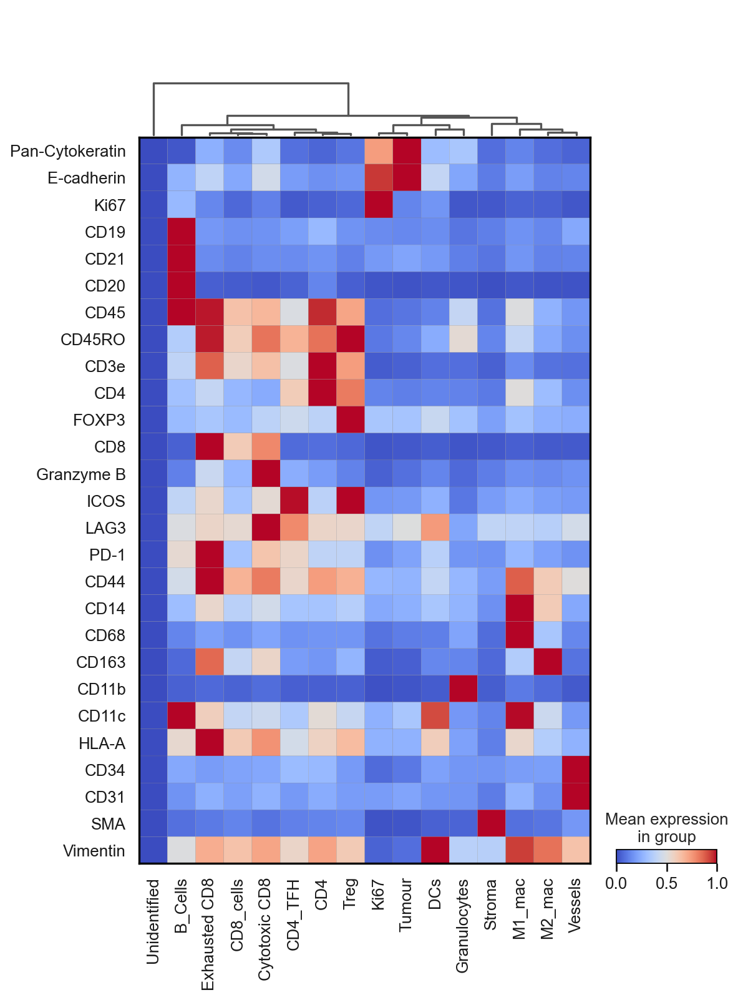

In [509]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=400)

sc.pl.matrixplot(adata, var_names= ct, groupby='CT_final', dendrogram=True,
                 use_raw=False, cmap="coolwarm", standard_scale='var', 
                 swap_axes= True,
                 save = 'CT_final.svg')

In [ ]:
sc.pl.stacked_violin(adata, var_names= ct, groupby='CT_final',
                 use_raw=False,  standard_scale='obs', cmap="seismic",
                 swap_axes= True,save='celltype_violin.svg'
                 )
warnings.filterwarnings('ignore')